## Подготовительная работа
* [Installing a Library Permanently in Colab](https://saturncloud.io/blog/how-to-install-a-library-permanently-in-colab/)

In [1]:
## connect google drive
from google.colab import drive


drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install virtualenv
!virtualenv /content/drive/MyDrive/vkr/kmu/virtual_env

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.9/468.9 kB 43.1 MB/s eta 0:00:00
created virtual environment CPython3.10.12.final.0-64 in 39608ms
  creator CPython3Posix(dest=/content/drive/MyDrive/vkr/kmu/virtual_env, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/root/.local/share/virtualenv)
    added seed packages: Cython==3.0.10, Jinja2==3.1.3, MarkupSafe==2.1.5, affine==2.4.0, attrs==23.2.0, blosc2==2.6.1, certifi==2024.2.2, charset_normalizer==3.3.2, click==8.1.7, click_plugins==1.1.1, cligj==0.7.2, contextily==1.6.0, contourpy==1.2.0, cycler==0.12.1, cykhash==2.0.1, fiona==1.9.6, fonttools==4.50.0, geographiclib==2.0, geopandas==0.14.3, geopy==2.4.1, h3==3.7.7, h3pandas==0.2.6, idna==3.6, joblib==1.3.2, kiwisolver==1.4.5, mapclassify==2.6.1, matplotlib==3.8.3, mercantile==1.2.1, msgpack==1.0.8

In [3]:
import sys


venv_path = "/content/drive/MyDrive/vkr/kmu/virtual_env/lib/python3.10/site-packages"
if venv_path not in sys.path:
  # add the path of the virtual environment site-packages to colab system path
  sys.path.append(venv_path)
sys.path

['/content',
 '/env/python',
 '/usr/lib/python310.zip',
 '/usr/lib/python3.10',
 '/usr/lib/python3.10/lib-dynload',
 '',
 '/usr/local/lib/python3.10/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.10/dist-packages/IPython/extensions',
 '/root/.ipython',
 '/content/drive/MyDrive/vkr/kmu/virtual_env/lib/python3.10/site-packages']

## H3

```bash
!source /content/drive/MyDrive/vkr/kmu/virtual_env/bin/activate; pip install pyrosm contextily mapclassify osmnx pandana h3pandas
```

In [4]:
!source /content/drive/MyDrive/vkr/kmu/virtual_env/bin/activate; pip install h3pandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.4/138.4 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 11.2 MB/s eta 0:00:00
  Created wheel for h3pandas: filename=h3pandas-0.2.6-py3-none-any.whl size=19688 sha256=b7fef9ae0a58baf9d8378b60be9eefbea12cfa928d60062ef05cad6820514e24
  Stored in directory: /root/.cache/pip/wheels/53/16/29/87a50ed96709a186f34192adccb57d691f2c5b6605bae71a3b
Successfully built h3pandas


In [ ]:
!pip freeze

### Конфигурация

In [4]:
DIR_OSM = '/content/drive/MyDrive/vkr/kmu/src/osm/'
CITY = 'SanktPetersburg'
BBOX = [30.2561753, 59.929385, 30.3637657, 59.9832816]
UTM_ZONE = 32636
MAP_DIST = 50
MAX_DIST = 500
MAX_ITEMS = 10

config = {
    'dir_osm': DIR_OSM,
    'city': CITY,
    'crs': UTM_ZONE,
    'filters': {
        'buildings': {
            'all': {
                'building': True
            },
            'residential_only': {
                'building': [
                'apartments',
                'residential'
              ]
            }
        },
        'POIs': {
            'shop': [
                'convenience',
                'supermarket',
                'mall',
                'greengrocer'
            ],
            'amenity': [
                'pharmacy',
                'school',
                'kindergarten',
                'clinic'
            ],
            'healthcare': [
                'clinic'
            ]
        },
        'network_type': [
            'walking',
            'driving'
        ]
    },
    'bbox': BBOX,
    'map_dist': MAP_DIST,
    'max_dist': MAX_DIST,
    'max_items': MAX_ITEMS
}

### Логирование

<details>
<summary> Log levels</summary>

```py
logging.debug("A DEBUG Message")
logging.info("An INFO")
logging.warning("A WARNING")
logging.error("An ERROR")
logging.critical("A message of CRITICAL severity")
```
</details>

In [ ]:
!pwd

/content


In [5]:
import logging


logger = logging.getLogger()
fhandler = logging.FileHandler(filename=config["dir_osm"]+'h3.log', mode='w')
logger.addHandler(fhandler)
logger.setLevel(logging.INFO)

### Загрузка подготовленных данных

In [6]:
from geopandas import read_file


fp = ''
network_type = config['filters']['network_type'][0]
#network_type = config['filters']['network_type'][1]

if 'bbox' in config:
  fp = DIR_OSM + 'spb_bbox.gpkg'

  # buildings
  buildings = read_file(fp, layer='buildings_with_objective_metrics')
  if buildings.crs is None:
     logger.info(f'buildings crs is None')

  # pois
  pois = read_file(fp, layer='pois').set_index('id')
  if pois.crs is None:
     logger.info(f'pois crs is None')

  # graph
  nodes = read_file(fp, layer=f'{network_type}_nodes').set_index('id')
  edges = read_file(fp, layer=f'{network_type}_edges')
  if nodes.crs is None:
     logger.info(f'graph crs is None')

  logger.info(f'read buildings/pois/{network_type}_graph from {fp}')

else:
  fp = DIR_OSM + 'spb.gpkg'

  # buildings
  buildings = read_file(fp, layer='buildings_with_objective_metrics')
  if buildings.crs is None:
     logger.info(f'buildings crs is None')

  # pois
  pois = read_file(fp, layer='pois').set_index('id')
  if pois.crs is None:
     logger.info(f'pois crs is None')

  # graph
  nodes = read_file(fp, layer=f'{network_type}_nodes').set_index('id')
  edges = read_file(fp, layer=f'{network_type}_edges')
  if nodes.crs is None:
     logger.info(f'graph crs is None')

  logger.info(f'read buildings/pois/{network_type}_graph from {fp}')


INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:root:read buildings/pois/walking_graph from /content/drive/MyDrive/vkr/kmu/src/osm/spb_bbox.gpkg


In [7]:
buildings.head(2)

,id,building,centroid_x,centroid_y,node_id,access_sum,k_div_access,accessibility,proximity,geometry
0,16960662,apartments,346952.030481,6.648785e+06,7177932386,0.205882,0.4,0.082353,0.695502,"POLYGON ((346938.573 6648792.461, 346950.029 6..."
1,17063465,apartments,346792.083845,6.649158e+06,5824120858,0.058824,0.2,0.011765,0.070108,"POLYGON ((346796.010 6649130.969, 346780.855 6..."


In [8]:
pois.head(2)

,pois,centroid_x,centroid_y,geometry
id,,,,
332263460,supermarket,350111.535453,6.650154e+06,POINT (350111.535 6650153.889)
339394777,pharmacy,349698.538406,6.649758e+06,POINT (349698.538 6649757.709)


In [9]:
nodes.head(2)

,x,y,geometry
id,,,
10240355599,350768.977867,6.647817e+06,POINT (350768.978 6647816.641)
1591433310,350772.206656,6.647831e+06,POINT (350772.207 6647830.545)


In [10]:
edges.head(2)

,u,v,length,oneway,highway,geometry
0,10240355599,1591433310,14.247,no,unclassified,"LINESTRING (350768.978 6647816.641, 350769.630..."
1,1591433310,9296451194,24.230,no,unclassified,"LINESTRING (350772.207 6647830.545, 350777.960..."


In [16]:
buildings['centroid'] = buildings.centroid

In [12]:
buildings.head(2)

,id,building,centroid_x,centroid_y,node_id,access_sum,k_div_access,accessibility,proximity,geometry,centroid
0,16960662,apartments,346952.030481,6.648785e+06,7177932386,0.205882,0.4,0.082353,0.695502,"POLYGON ((346938.573 6648792.461, 346950.029 6...",POINT (346952.030 6648785.442)
1,17063465,apartments,346792.083845,6.649158e+06,5824120858,0.058824,0.2,0.011765,0.070108,"POLYGON ((346796.010 6649130.969, 346780.855 6...",POINT (346792.084 6649157.673)


In [54]:
WGS84 = 4326
buildings_3d = buildings.rename(columns={'geometry': 'footprint', 'centroid': 'geometry'}).to_crs(crs=4326)
logger.info(f'reproject buldings to {WGS84}')

INFO:root:reproject buldings to 4326


In [55]:
buildings_3d.head(2)

,id,building,centroid_x,centroid_y,node_id,access_sum,k_div_access,accessibility,proximity,footprint,geometry
0,16960662,apartments,346952.030481,6.648785e+06,7177932386,0.205882,0.4,0.082353,0.695502,"POLYGON ((346938.573 6648792.461, 346950.029 6...",POINT (30.25989 59.94797)
1,17063465,apartments,346792.083845,6.649158e+06,5824120858,0.058824,0.2,0.011765,0.070108,"POLYGON ((346796.010 6649130.969, 346780.855 6...",POINT (30.25675 59.95125)


In [107]:
import h3pandas


def aggr_and_plot_h3(res, res_tag, zoom, subplot_flag=0, pois_flag=0):
  buildings_h3 = buildings_3d.h3.geo_to_h3(res)
  logger.info(f'add h3_{res} index to buildings')
  buildings_h3_aggr_accessibility = buildings_h3[['accessibility']].groupby(res_tag).mean().h3.h3_to_geo_boundary().to_crs(config['crs'])
  logger.info(f'aggregate accessibility in h3_{res} index')
  if subplot_flag:
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
    ax = buildings_h3_aggr_accessibility.plot(ax=axes[0], column='accessibility', legend=True, edgecolor='black', alpha=0.6)
    #ax = buildings.boundary.plot(ax=ax, edgecolor='black', alpha=0.7)
    if pois_flag:
      ax = pois.plot(ax=ax, column='pois', legend=True, markersize=50, edgecolor='black')
    plt.setp(ax, xlim=zoom[0], ylim=zoom[1])
    plt.setp(axes[1], xlim=zoom[0], ylim=zoom[1])
    cx.add_basemap(ax=ax, crs=buildings_h3_aggr_accessibility.crs.to_string(), source=cx.providers.CartoDB.Voyager)
    cx.add_basemap(ax=axes[1], crs=buildings_h3_aggr_accessibility.crs.to_string(), source=cx.providers.CartoDB.Voyager)
    ax.set_title(f'{res_tag} cells with accessibility via {network_type} network', fontsize=15, fontweight='bold')
    fp = config['dir_osm']+f'images/{res_tag}_cells_with_accessibility_via_{network_type}_network_subplot.png'
    plt.savefig(fp)
    logger.info(f'save {res_tag} cells with accessibility to {fp}')
    plt.show()
  else:
    ax = buildings_h3_aggr_accessibility.plot(figsize=(20, 10), column='accessibility', legend=True, edgecolor='black', alpha=0.6)
    #ax = buildings.boundary.plot(ax=ax, edgecolor='black', alpha=0.7)
    if pois_flag:
      ax = pois.plot(ax=ax, column='pois', legend=True, markersize=50, edgecolor='black')
    plt.setp(ax, xlim=zoom[0], ylim=zoom[1])
    cx.add_basemap(ax=ax, crs=buildings_h3_aggr_accessibility.crs.to_string(), source=cx.providers.CartoDB.Voyager)
    ax.set_title(f'{res_tag} cells with accessibility via {network_type} network', fontsize=15, fontweight='bold')
    fp = config['dir_osm']+f'images/{res_tag}_cells_with_accessibility_via_{network_type}_network.png'
    plt.savefig(fp)
    logger.info(f'save {res_tag} cells with accessibility to {fp}')
    plt.show()

[H3 resolution](https://russianblogs.com/article/93243931143/)

In [96]:
xmin = 346000
xmax = 353000
ymin = 6646000
ymax = 6653000

no_zoom = [(xmin, xmax), (ymin, ymax)]
zoom = [(349100-500, 349600+500), (6649900-500, 6650400+500)]

INFO:root:add h3_10 index to buildings
INFO:root:aggregate accessibility in h3_10 index
INFO:root:save h3_10 cells with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/h3_10_cells_with_accessibility_via_walking_network.png


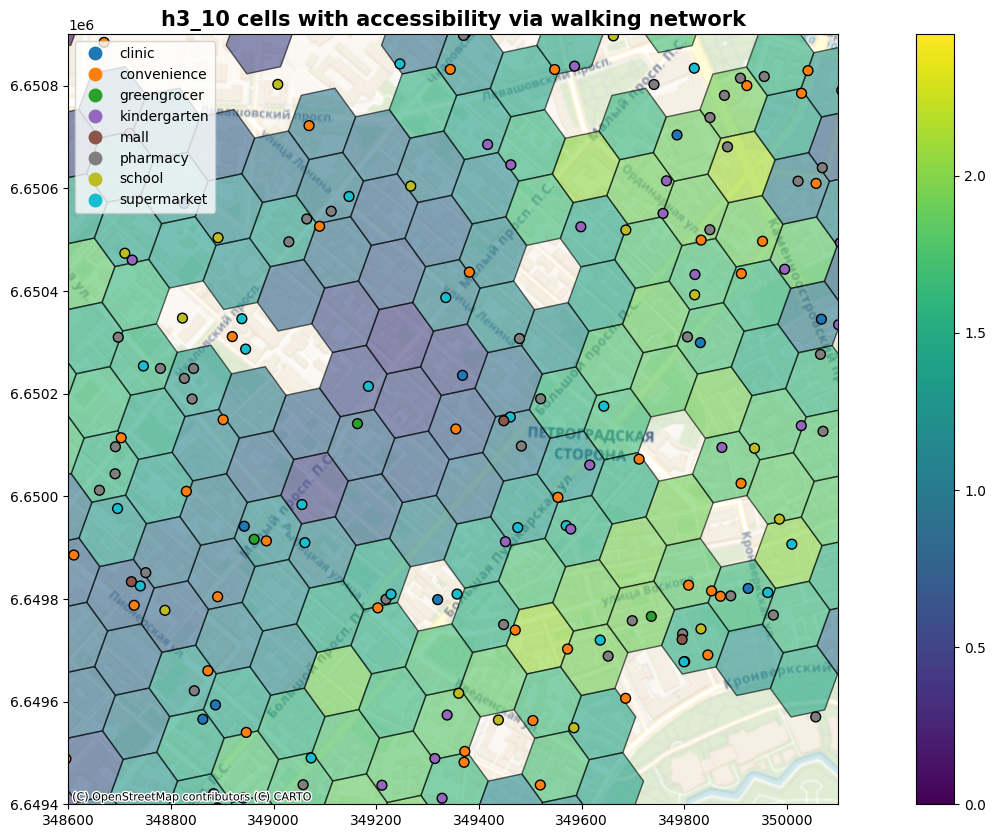

In [97]:
aggr_and_plot_h3(10, 'h3_10', zoom, pois_flag=1)

INFO:root:add h3_9 index to buildings
INFO:root:aggregate accessibility in h3_9 index
INFO:root:save h3_09 cells with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/h3_09_cells_with_accessibility_via_walking_network.png


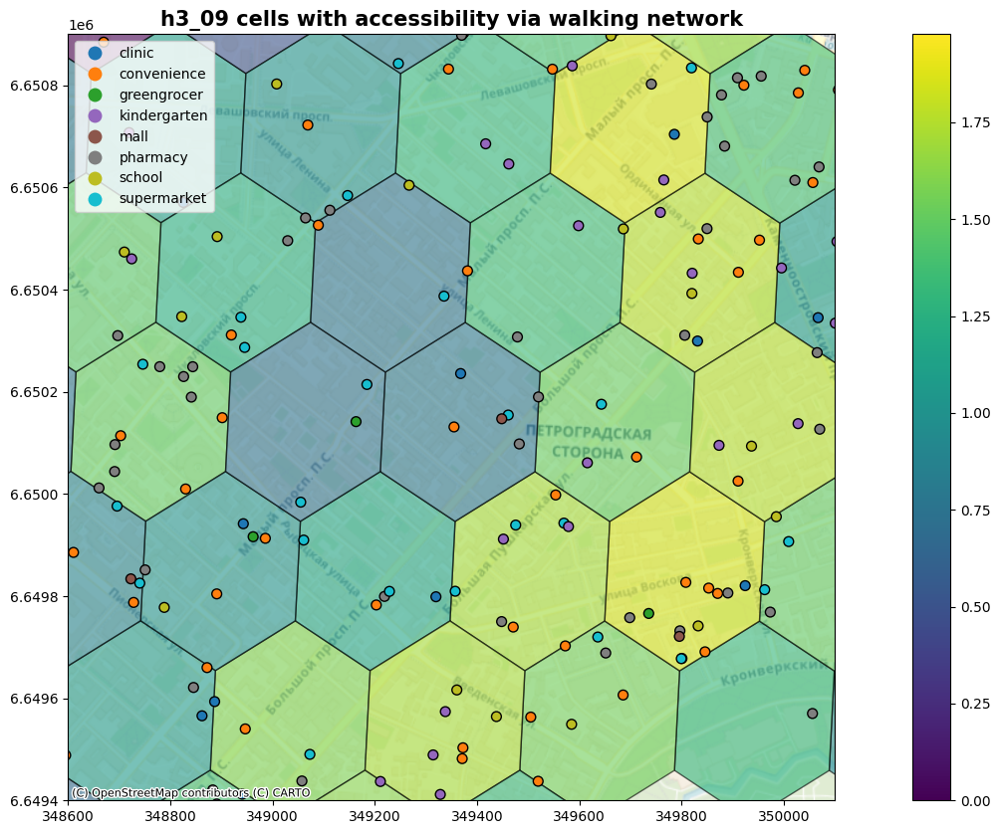

In [111]:
aggr_and_plot_h3(9, 'h3_09', zoom, pois_flag=1)

INFO:root:add h3_8 index to buildings
INFO:root:aggregate accessibility in h3_8 index
INFO:root:save h3_08 cells with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/h3_08_cells_with_accessibility_via_walking_network.png


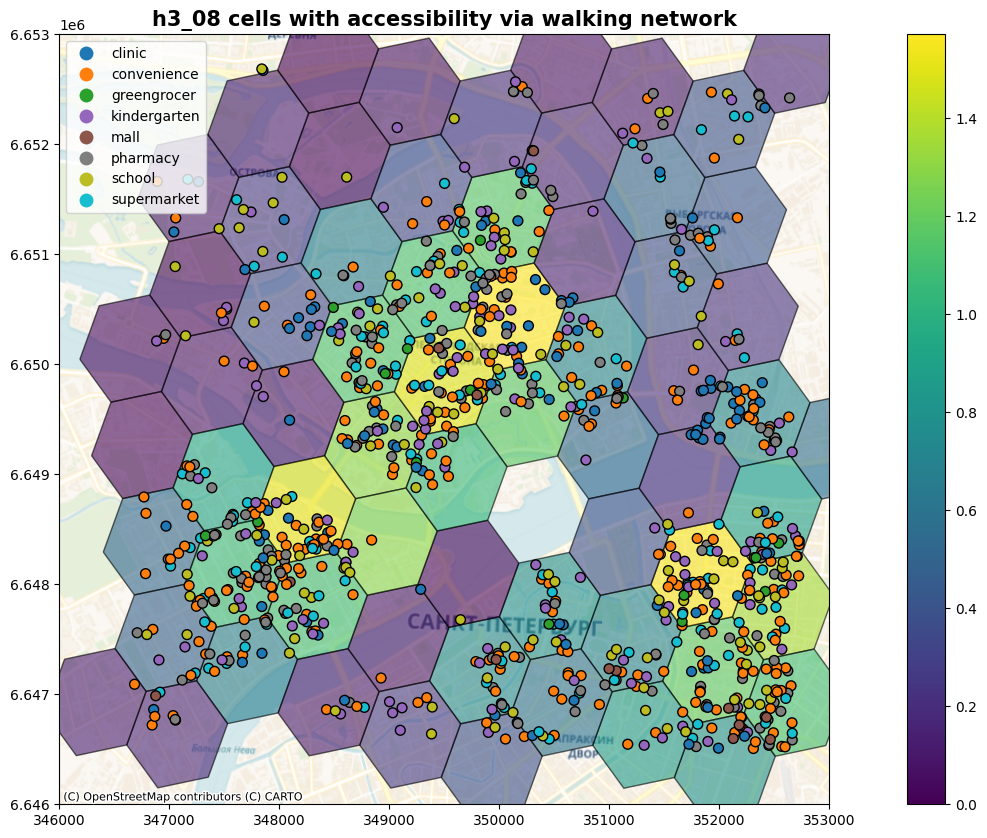

In [100]:
aggr_and_plot_h3(8, 'h3_08', no_zoom, pois_flag=1)

INFO:root:add h3_8 index to buildings
INFO:root:aggregate accessibility in h3_8 index
INFO:root:save h3_08 cells with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/h3_08_cells_with_accessibility_via_walking_network_subplot.png


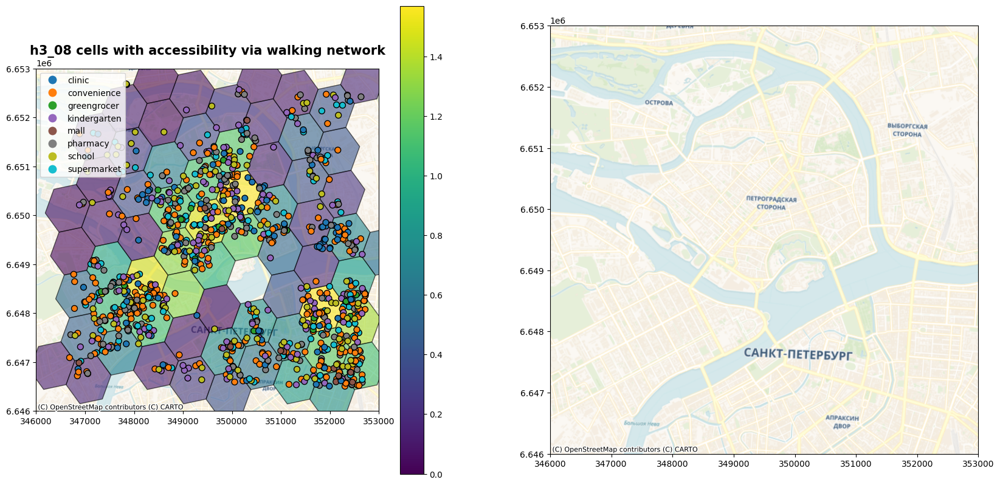

In [109]:
aggr_and_plot_h3(8, 'h3_08', no_zoom, 1, pois_flag=1)

INFO:root:add h3_8 index to buildings
INFO:root:aggregate accessibility in h3_8 index
INFO:root:save h3_08 cells with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/h3_08_cells_with_accessibility_via_walking_network_subplot.png


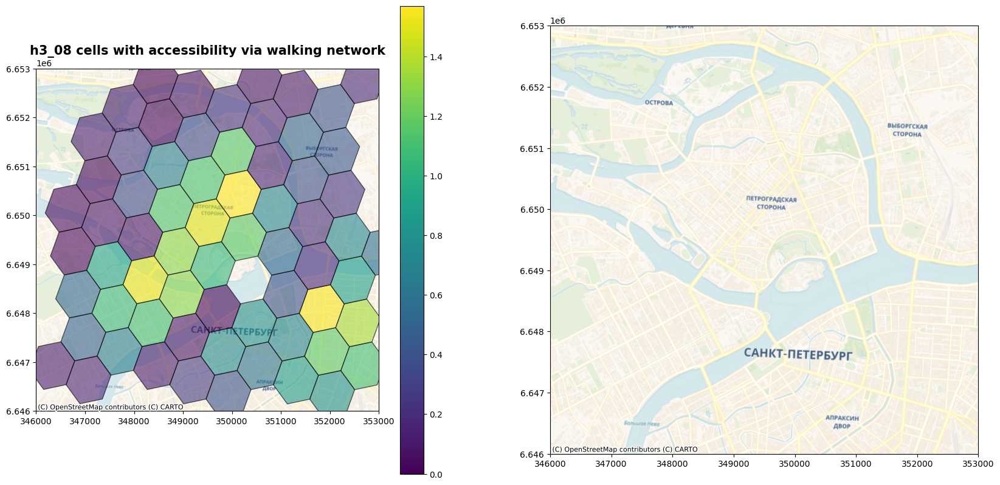

In [105]:
aggr_and_plot_h3(8, 'h3_08', no_zoom, 1)

INFO:root:add h3_8 index to buildings
INFO:root:aggregate accessibility in h3_8 index
INFO:root:save h3_08 cells with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/h3_08_cells_with_accessibility_via_walking_network_subplot.png


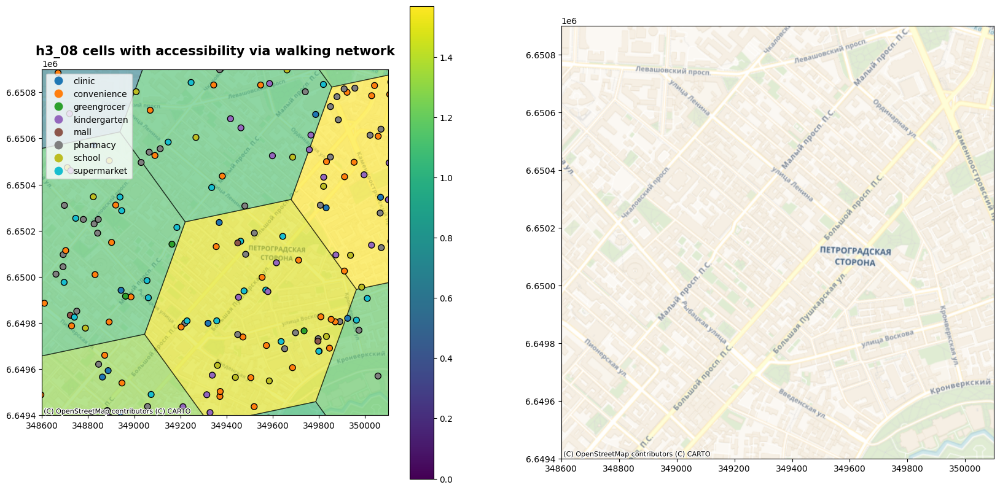

In [108]:
aggr_and_plot_h3(8, 'h3_08', zoom, 1, pois_flag=1)

INFO:root:add h3_8 index to buildings
INFO:root:aggregate accessibility in h3_8 index
INFO:root:save h3_08 cells with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/h3_08_cells_with_accessibility_via_walking_network_subplot.png


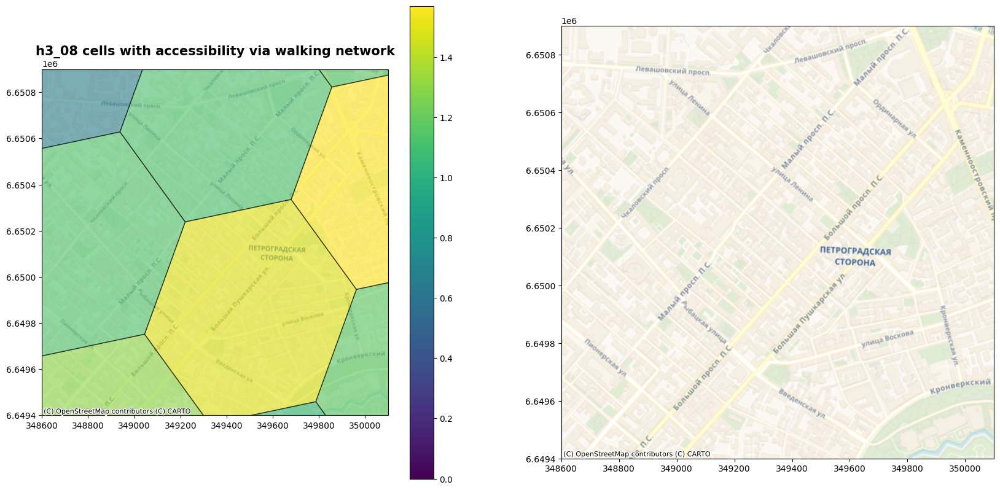

In [106]:
aggr_and_plot_h3(8, 'h3_08', zoom, 1)